#### Data Prepration : English to Nepali translation

In [ ]:
!pip install googletrans==3.1.0a0

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.1/55.1 kB 5.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 48.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.4/133.4 kB 13.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 4.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.6/42.6 kB 3.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.6/53.6 kB 6.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 65.0/65.0 kB 7.2 MB/s eta 0:00:00
  Created wheel for googletrans: filename=googletrans-3.1.0a0-py3-none-any.whl size=16352 sha256=034305f2d5565a383e4f886eb700c5e103361039a36c6d6f1e4f348521499fa6
  Stored in directory: /root/.cache/pip/wheels/50/5d/3c/8477d0af4ca2b8b1308812c09f1930863caeebc762fe265a95
Successfully built googletrans


In [ ]:
import os
import googletrans
from googletrans import Translator
import string
import nltk
import pickle
import re
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import cv2

In [ ]:
# Load data from drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!unzip /content/drive/MyDrive/video_cap/YouTubeClips.zip -d /content/drive/MyDrive/video_cap/

Archive:  /content/drive/MyDrive/video_cap/YouTubeClips.zip
   creating: /content/drive/MyDrive/video_cap/YouTubeClips/
  inflating: /content/drive/MyDrive/video_cap/YouTubeClips/-4wsuPCjDBc_5_15.avi  
  inflating: /content/drive/MyDrive/video_cap/YouTubeClips/-7KMZQEsJW4_205_208.avi  
  inflating: /content/drive/MyDrive/video_cap/YouTubeClips/-9CUm-2cui8_39_44.avi  
  inflating: /content/drive/MyDrive/video_cap/YouTubeClips/-_aaMGK6GGw_57_61.avi  
  inflating: /content/drive/MyDrive/video_cap/YouTubeClips/-_hbPLsZvvo_18_25.avi  
  inflating: /content/drive/MyDrive/video_cap/YouTubeClips/-_hbPLsZvvo_19_25.avi  
  inflating: /content/drive/MyDrive/video_cap/YouTubeClips/-_hbPLsZvvo_19_26.avi  
  inflating: /content/drive/MyDrive/video_cap/YouTubeClips/-_hbPLsZvvo_211_219.avi  
  inflating: /content/drive/MyDrive/video_cap/YouTubeClips/-_hbPLsZvvo_269_275.avi  
  inflating: /content/drive/MyDrive/video_cap/YouTubeClips/-_hbPLsZvvo_43_55.avi  
  inflating: /content/drive/MyDrive/video_cap

In [ ]:
# Paths
VIDEO_PATH = '/content/drive/MyDrive/video_cap/YouTubeClips/'
CAP_PATH = '/content/drive/MyDrive/video_cap/'
FRAMES_PATH = '/content/drive/MyDrive/video_cap/frames_output/'

In [ ]:
# Data frame
df = pd.read_csv(CAP_PATH+'videocorpus.csv')
df.columns = ['original_text','video_id','eng_captions']
print(df.shape)
df.head(5)

(80826, 3)


,original_text,video_id,eng_captions
0,-4wsuPCjDBc_5_15 a chipmunk is eating,-4wsuPCjDBc_5_15,a chipmunk is eating
1,-4wsuPCjDBc_5_15 a chipmunk is eating a peanut,-4wsuPCjDBc_5_15,a chipmunk is eating a peanut
2,-4wsuPCjDBc_5_15 a chipmunk is eating a nut,-4wsuPCjDBc_5_15,a chipmunk is eating a nut
3,-4wsuPCjDBc_5_15 a squirrel is eating a nut,-4wsuPCjDBc_5_15,a squirrel is eating a nut
4,-4wsuPCjDBc_5_15 a squirrel is eating a whole ...,-4wsuPCjDBc_5_15,a squirrel is eating a whole peanut


In [ ]:
# Initialize the translator
translator = Translator()

# Create an empty column for translated captions
df['nepali_captions'] = ''

# Iterate over each row in the dataframe
for index, row in df.iterrows():
    # Get the caption from the 'eng_captions' column
    caption = row['eng_captions']

    # Translate the caption to the desired language
    result = translator.translate(caption, src='en',dest='ne')
    translated_caption = result.text

    # Add the translated caption to the 'translated_captions' column
    df.at[index, 'nepali_captions'] = translated_caption
    print(index)

# Save the updated dataframe to a new CSV file
df.to_csv(CAP_PATH+'translated_nep_captions.csv', index=False)

Streaming output truncated to the last 5000 lines.
75826
75827
75828
75829
75830
75831
75832
75833
75834
75835
75836
75837
75838
75839
75840
75841
75842
75843
75844
75845
75846
75847
75848
75849
75850
75851
75852
75853
75854
75855
75856
75857
75858
75859
75860
75861
75862
75863
75864
75865
75866
75867
75868
75869
75870
75871
75872
75873
75874
75875
75876
75877
75878
75879
75880
75881
75882
75883
75884
75885
75886
75887
75888
75889
75890
75891
75892
75893
75894
75895
75896
75897
75898
75899
75900
75901
75902
75903
75904
75905
75906
75907
75908
75909
75910
75911
75912
75913
75914
75915
75916
75917
75918
75919
75920
75921
75922
75923
75924
75925
75926
75927
75928
75929
75930
75931
75932
75933
75934
75935
75936
75937
75938
75939
75940
75941
75942
75943
75944
75945
75946
75947
75948
75949
75950
75951
75952
75953
75954
75955
75956
75957
75958
75959
75960
75961
75962
75963
75964
75965
75966
75967
75968
75969
75970
75971
75972
75973
75974
75975
75976
75977
75978
75979
75980
75981
75982
75983
7

In [ ]:
review = pd.read_csv(CAP_PATH+'translated_nep_captions.csv')
review.tail(5)

,original_text,video_id,eng_captions,nepali_captions
80821,zzit5b_-ukg_5_20 a boy is excersizing,zzit5b_-ukg_5_20,a boy is excersizing,एक केटा व्यायाम गर्दैछ
80822,zzit5b_-ukg_5_20 a child play with a machine,zzit5b_-ukg_5_20,a child play with a machine,बच्चा मेसिनसँग खेल्दै
80823,zzit5b_-ukg_5_20 a boy playing their,zzit5b_-ukg_5_20,a boy playing their,एक केटा आफ्नो खेल्दै
80824,zzit5b_-ukg_5_20 a young child is using an exe...,zzit5b_-ukg_5_20,a young child is using an exercise machine,एक जवान बच्चा एक व्यायाम मेसिन प्रयोग गर्दैछ
80825,zzit5b_-ukg_5_20 the boy is exercising,zzit5b_-ukg_5_20,the boy is exercising,केटा व्यायाम गर्दैछ


In [ ]:
# Specify the column name to be modified
column_name = 'nepali_captions'

# Replace the word in the specified column
df[column_name] = df[column_name].str.replace('chipmunk', 'चिपमङ्कले')

# Save the modified dataframe to a new CSV file
df.to_csv(CAP_PATH+'nepali_captions.csv', index=False)

In [ ]:
df.tail(5)

,original_text,video_id,eng_captions,nepali_captions
80821,zzit5b_-ukg_5_20 a boy is excersizing,zzit5b_-ukg_5_20,a boy is excersizing,एक केटा व्यायाम गर्दैछ
80822,zzit5b_-ukg_5_20 a child play with a machine,zzit5b_-ukg_5_20,a child play with a machine,बच्चा मेसिनसँग खेल्दै
80823,zzit5b_-ukg_5_20 a boy playing their,zzit5b_-ukg_5_20,a boy playing their,एक केटा आफ्नो खेल्दै
80824,zzit5b_-ukg_5_20 a young child is using an exe...,zzit5b_-ukg_5_20,a young child is using an exercise machine,एक जवान बच्चा एक व्यायाम मेसिन प्रयोग गर्दैछ
80825,zzit5b_-ukg_5_20 the boy is exercising,zzit5b_-ukg_5_20,the boy is exercising,केटा व्यायाम गर्दैछ


#### Video Captioning Implementation

#### Data Processing

In [ ]:
import os
import string
import nltk
import pickle
import re
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import cv2
from nltk.tokenize import word_tokenize
import spacy

In [ ]:
# import tensorflow as tf
# from tensorflow.keras.preprocessing.sequence import pad_sequences
# from tensorflow.keras.preprocessing.text import Tokenizer
# from tensorflow.keras.utils import to_categorical
# from tensorflow.keras.models import Model
# from tensorflow.keras.layers import Input, Dense, LSTM, Embedding, TimeDistributed, Flatten
# from tensorflow.keras.applications.inception_v3 import InceptionV3
# from tensorflow.keras.optimizers import Adam
# from tensorflow.keras.callbacks import ModelCheckpoint
# from nltk.translate.bleu_score import corpus_bleu
# from nltk.translate.meteor_score import meteor_score
# #from pycocoevalcap.cider.cider import Cider


In [ ]:
# Load data from drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Paths
VIDEO_PATH = '/content/drive/MyDrive/video_cap/YouTubeClips/'
CAP_PATH = '/content/drive/MyDrive/video_cap/nepali_captions_v1.csv'
DATA_PATH = '//content/drive/MyDrive/video_cap/captions/'
MODEL_PATH = '/content/drive/MyDrive/video_cap/models/resnet101/'


# local paths for saving features
train_path = '/content/output/train/'
valid_path = '/content/output/valid/'
test_path ='/content/output/'

# drive paths for saving features
train_drive_path = '/content/drive/MyDrive/video_cap/features/resnet101/train/feat/'
valid_drive_path = '/content/drive/MyDrive/video_cap/features/resnet101/valid/feat/'
test_drive_path = '/content/drive/MyDrive/video_cap/features/resnet101/test/feat/'

In [ ]:
################################################################################################

In [ ]:
import shutil
import os
def make_paths(path):
  if os.path.exists(path):
    shutil.rmtree(path)
  os.makedirs(path)

make_paths(test_path)
make_paths(test_path+'train')
make_paths(test_path+'valid')

In [ ]:
import os
import json
import random
import numpy as np
import cv2
import shutil
import pandas as pd
import tensorflow as tf
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.resnet import ResNet101
from tensorflow.keras.applications.resnet import ResNet50
from tensorflow.keras.applications.efficientnet import EfficientNetB0

from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, LSTM, Dense
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.preprocessing.text import Tokenizer

In [ ]:
# # Run only once to save data
# import pandas as pd
# from sklearn.model_selection import train_test_split

# # Assuming your dataframe is named 'df' with columns 'video_id' and 'captions'
# df = pd.read_csv(CAP_PATH)
# print(df.head(5))


# # Assuming your DataFrame is named 'df' with columns 'video_id' and 'nepali_captions'

# # Get unique video_ids
# unique_video_ids = df['video_id'].unique()

# # Split the unique video_ids into train, validation, and test sets
# train_video_ids, remaining_video_ids = train_test_split(unique_video_ids, test_size=0.2)
# valid_video_ids, test_video_ids = train_test_split(remaining_video_ids, test_size=0.5)
# print(len(train_video_ids),len(valid_video_ids),len(test_video_ids))
# #print(train_video_ids)
# #print(valid_video_ids)

# # Filter the DataFrame based on the train, validation, and test video_ids
# train_df = df[df['video_id'].isin(train_video_ids)]
# valid_df = df[df['video_id'].isin(valid_video_ids)]
# test_df = df[df['video_id'].isin(test_video_ids)]

# # Print the shapes of the resulting DataFrames
# print("Total set shape:", df.shape)
# print("Train set shape:", train_df.shape)
# print("Validation set shape:", valid_df.shape)
# print("Test set shape:", test_df.shape)

# # save to drive
# train_df.to_csv(DATA_PATH+'train_df.csv')
# valid_df.to_csv(DATA_PATH+'valid_df.csv')
# test_df.to_csv(DATA_PATH+'test_df.csv')


In [ ]:
# Load train, valid, test data
df = pd.read_csv(CAP_PATH)
train_df = pd.read_csv(DATA_PATH+'train_df.csv')
valid_df = pd.read_csv(DATA_PATH+'valid_df.csv')
test_df = pd.read_csv(DATA_PATH+'test_df.csv')

train_video_ids = train_df['video_id'].unique()
valid_video_ids = valid_df['video_id'].unique()
test_video_ids = test_df['video_id'].unique()

print("Train set shape:", train_df.shape)
print("Validation set shape:", valid_df.shape)
print("Test set shape:", test_df.shape)

print(train_video_ids)

Train set shape: (64477, 5)
Validation set shape: (8120, 5)
Test set shape: (8229, 5)
['-4wsuPCjDBc_5_15 ' '-7KMZQEsJW4_205_208 ' '-8y1Q0rA3n8_108_115 ' ...
 'zv2RIbUsnSw_335_341 ' 'zxB4dFJhHR8_1_9 ' 'zzit5b_-ukg_5_20 ']


In [ ]:
# Extract features
def video_to_frames(video):
    print(video)
    path = os.path.join(test_path, 'temporary_images')
    if os.path.exists(path):
        shutil.rmtree(path)
    os.makedirs(path)
    # video_path = os.path.join(test_path, 'video', video)
    video_path = VIDEO_PATH + video
    count = 0
    image_list = []
    # Path to video file
    cap = cv2.VideoCapture(video_path)
    while cap.isOpened():
        ret, frame = cap.read()
        if ret is False:
            break
        cv2.imwrite(os.path.join(test_path, 'temporary_images', 'frame%d.jpg' % count), frame)
        image_list.append(os.path.join(test_path, 'temporary_images', 'frame%d.jpg' % count))
        count += 1

    cap.release()
    cv2.destroyAllWindows()
    return image_list


In [ ]:
def model_cnn_load():
    model = ResNet101(weights="imagenet", include_top=True, input_shape=(224, 224, 3))
    out = model.layers[-2].output
    model_final = Model(inputs=model.input, outputs=out)
    return model_final


def load_image(path):
    img = cv2.imread(path)
    img = cv2.resize(img, (224, 224))
    return img


def extract_features(video, model):
    video_id = video.split(".")[0]
    print(video_id)
    print(f'Processing video {video}')

    image_list = video_to_frames(video)
    print(image_list)
    samples = np.round(np.linspace(0, len(image_list) - 1, 30))
    image_list = [image_list[int(sample)] for sample in samples]
    images = np.zeros((len(image_list), 224, 224, 3))
    for i in range(len(image_list)):
        img = load_image(image_list[i])
        images[i] = img
    images = np.array(images)
    fc_feats = model.predict(images, batch_size=128)
    img_feats = np.array(fc_feats)
    shutil.rmtree(os.path.join(test_path, 'temporary_images'))
    return img_feats


def extract_feats_pretrained_cnn(path,drive_path,video_list):
    model = model_cnn_load()
    print('Model loaded')

    if not os.path.isdir(os.path.join(path, 'feat')):
        os.mkdir(os.path.join(path, 'feat'))


    for video in video_list:
        item = video.strip()+'.avi'
        outfile = os.path.join(path, 'feat', item.split(".")[0] + '.npy')
        drivefile = drive_path+item.split(".")[0] + '.npy'
        img_feats = extract_features(item, model)
        np.save(outfile, img_feats)
        np.save(drivefile, img_feats)

In [ ]:
vocab_list = []

def train_valid_test_list(df):
  data_list = []
  for idx, row in df.iterrows():
    v_id = row['video_id']
    v_id = v_id.strip()
    caption = row['nepali_captions']
    caption = "bos " + caption.strip() + " eos"

    if len(caption.split()) < 2:
      continue
    # if len(caption.split()) > 20 or len(caption.split()) < 3:
    #   continue
    else:
      data_list.append([caption, v_id])

  return data_list

total_list = train_valid_test_list(df)
train_list = train_valid_test_list(train_df)
valid_list = train_valid_test_list(valid_df)
test_list = train_valid_test_list(test_df)
print(total_list[:5])
print(train_list[:5])
print(valid_list[:5])
print(test_list[:5])

[['bos एउटा चिपमङ्कले खाइरहेको छ eos', '-4wsuPCjDBc_5_15'], ['bos एउटा चिपमङ्कले बदाम खाइरहेको छ eos', '-4wsuPCjDBc_5_15'], ['bos एउटा चिपमङ्कले नट खाइरहेको छ eos', '-4wsuPCjDBc_5_15'], ['bos एउटा गिलहरीले नट खाइरहेको छ eos', '-4wsuPCjDBc_5_15'], ['bos एउटा गिलहरीले पुरै बदाम खाइरहेको छ eos', '-4wsuPCjDBc_5_15']]
[['bos एउटा चिपमङ्कले खाइरहेको छ eos', '-4wsuPCjDBc_5_15'], ['bos एउटा चिपमङ्कले बदाम खाइरहेको छ eos', '-4wsuPCjDBc_5_15'], ['bos एउटा चिपमङ्कले नट खाइरहेको छ eos', '-4wsuPCjDBc_5_15'], ['bos एउटा गिलहरीले नट खाइरहेको छ eos', '-4wsuPCjDBc_5_15'], ['bos एउटा गिलहरीले पुरै बदाम खाइरहेको छ eos', '-4wsuPCjDBc_5_15']]
[['bos एक शेफले भाँडोबाट भुटेको खाना निकाल्छ eos', '-_hbPLsZvvo_269_275'], ['bos एक जना मानिस कद्दू फ्राइरहेछ eos', '-_hbPLsZvvo_269_275'], ['bos एक व्यक्ति खाना भुटेको छ eos', '-_hbPLsZvvo_269_275'], ['bos एक व्यक्तिले खाना उमालेको भाँडोबाट ग्रिलमा सार्दै छ eos', '-_hbPLsZvvo_269_275'], ['bos एक व्यक्तिले भुटेको स्क्वाशको टुक्रा र त्यसपछि भुटेको मासुको टुक्रा एक कवचब

In [ ]:
# # Extract features
# extract_feats_pretrained_cnn(train_path,train_drive_path,train_video_ids)
# extract_feats_pretrained_cnn(valid_path,valid_drive_path,valid_video_ids)

179648224/179648224 [==============================] - 1s 0us/step
Model loaded
-4wsuPCjDBc_5_15
Processing video -4wsuPCjDBc_5_15.avi
-4wsuPCjDBc_5_15.avi
['/content/output/temporary_images/frame0.jpg', '/content/output/temporary_images/frame1.jpg', '/content/output/temporary_images/frame2.jpg', '/content/output/temporary_images/frame3.jpg', '/content/output/temporary_images/frame4.jpg', '/content/output/temporary_images/frame5.jpg', '/content/output/temporary_images/frame6.jpg', '/content/output/temporary_images/frame7.jpg', '/content/output/temporary_images/frame8.jpg', '/content/output/temporary_images/frame9.jpg', '/content/output/temporary_images/frame10.jpg', '/content/output/temporary_images/frame11.jpg', '/content/output/temporary_images/frame12.jpg', '/content/output/temporary_images/frame13.jpg', '/content/output/temporary_images/frame14.jpg', '/content/output/temporary_images/frame15.jpg', '/content/output/temporary_images/frame16.jpg', '/content/output/temporary_images/fra

In [ ]:
!zip -r /content/effnetB0.zip /content/output

  adding: content/output/ (stored 0%)
  adding: content/output/valid/ (stored 0%)
  adding: content/output/valid/feat/ (stored 0%)
  adding: content/output/valid/feat/ViM0JjUoqRw_10_20.npy (deflated 8%)
  adding: content/output/valid/feat/hbE29pZh76I_3_8.npy (deflated 8%)
  adding: content/output/valid/feat/b24_bb57PPk_631_637.npy (deflated 8%)
  adding: content/output/valid/feat/otvx5OZHTJc_1_22.npy (deflated 8%)
  adding: content/output/valid/feat/qeKX-N1nKiM_37_43.npy (deflated 8%)
  adding: content/output/valid/feat/OIg10Bl7urs_0_10.npy (deflated 8%)
  adding: content/output/valid/feat/uH8ObB_dyOk_159_166.npy (deflated 8%)
  adding: content/output/valid/feat/TZ860P4iTaM_10_24.npy (deflated 8%)
  adding: content/output/valid/feat/ok4cM6WTA5E_120_133.npy (deflated 8%)
  adding: content/output/valid/feat/YXixZrSxefk_17_48.npy (deflated 8%)
  adding: content/output/valid/feat/hJFBXHtxKIc_204_209.npy (deflated 8%)
  adding: content/output/valid/feat/X_NLV2KCnIE_60_70.npy (deflated 8%)
 

In [ ]:
from google.colab import files
files.download("/content/effnetB0.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
#from tensorflow.keras.layers.experimental.preprocessing import TextVectorization

for train in train_list:
    vocab_list.append(train[0])
print(len(vocab_list))
print(vocab_list[:5])

tokenizer = Tokenizer()
tokenizer.fit_on_texts(vocab_list)

print("Vocab_list_size: "+str(len(vocab_list)))

# Get the vocabulary size
#vocab_size = len(tokenizer.word_index)
vocab_size = max(tokenizer.word_index.values()) + 1

# Print the vocabulary size
print("Vocabulary Size:", vocab_size)
#print(tokenizer.word_index[0])

64477
['bos एउटा चिपमङ्कले खाइरहेको छ eos', 'bos एउटा चिपमङ्कले बदाम खाइरहेको छ eos', 'bos एउटा चिपमङ्कले नट खाइरहेको छ eos', 'bos एउटा गिलहरीले नट खाइरहेको छ eos', 'bos एउटा गिलहरीले पुरै बदाम खाइरहेको छ eos']
Vocab_list_size: 64477
Vocabulary Size: 15585


In [ ]:
# TRAIN_FEATURE_DIR = os.path.join(train_path, 'feat')
# VALID_FEATURE_DIR = os.path.join(valid_path, 'feat')
TRAIN_FEATURE_DIR = train_drive_path
VALID_FEATURE_DIR = valid_drive_path

t_data = {}
v_data = {}

for filename in os.listdir(TRAIN_FEATURE_DIR):
    f = np.load(os.path.join(TRAIN_FEATURE_DIR, filename))
    t_data[filename[:-4]] = f

for fname in os.listdir(VALID_FEATURE_DIR):
    v = np.load(os.path.join(VALID_FEATURE_DIR, fname))
    v_data[fname[:-4]] = v


In [ ]:
# Get first value from dictionary
# Get shape of cnn output
cnn_feature = list(t_data.values())[0]
print('Shape: ', cnn_feature.shape)

Shape:  (30, 2048)


In [ ]:
def load_datatest( epochs=100, x_data=t_data, tokenizer=tokenizer, num_decoder_tokens=vocab_size, training_list=train_list, batch_size=128, maxlen=10):
    encoder_input_data = []
    decoder_input_data = []
    decoder_target_data = []
    videoId = []
    videoSeq = []

    # Separating the videoId and the video captions
    for idx, cap in enumerate(training_list):
        caption = cap[0]
        videoId.append(cap[1])
        videoSeq.append(caption)
    print(len(videoId),len(videoSeq))
    print(videoId[:50])
    print(videoSeq[:50])
    # Converting the captions to tokens and padding them to equal sizes
    train_sequences = tokenizer.texts_to_sequences(videoSeq)
    train_sequences = np.array(train_sequences)
    train_sequences = pad_sequences(train_sequences, padding='post', truncating='post', maxlen=maxlen)
    max_seq_length = train_sequences.shape[1]
    filesize = len(train_sequences)

    print(train_sequences.shape)
    print("max seq len: "+str(max_seq_length))
    print("len train seq: "+str(filesize))
    X_data = []
    y_data = []
    vCount = 0
    n = 0

    for i in range(epochs):
        for idx in range(0, filesize):
            n += 1
            encoder_input_data.append(x_data[videoId[idx]])
            y = to_categorical(train_sequences[idx], num_decoder_tokens)
            decoder_input_data.append(y[:-1])
            decoder_target_data.append(y[1:])

            if n == batch_size:
                encoder_input = np.array(encoder_input_data)
                decoder_input = np.array(decoder_input_data)
                decoder_target = np.array(decoder_target_data)

                encoder_input_data = []
                decoder_input_data = []
                decoder_target_data = []
                n = 0

                yield ([encoder_input, decoder_input], decoder_target)


In [ ]:
time_steps_encoder = 30
num_encoder_tokens = 2048 #1280
latent_dim = 1024
time_steps_decoder = 10 # max seq length
num_decoder_tokens = vocab_size
batch_size = 128

encoder_inputs = Input(shape=(time_steps_encoder, num_encoder_tokens), name="encoder_inputs")
encoder = LSTM(latent_dim, return_state=True, return_sequences=True, name='encoder_lstm')
_, state_h, state_c = encoder(encoder_inputs)
encoder_states = [state_h, state_c]

# Set up the decoder
decoder_inputs = Input(shape=(time_steps_decoder
                              , num_decoder_tokens), name="decoder_inputs")
decoder_lstm = LSTM(latent_dim, return_sequences=True, return_state=True, name='decoder_lstm')
decoder_outputs, _, _ = decoder_lstm(decoder_inputs, initial_state=encoder_states)
decoder_dense = Dense(num_decoder_tokens, activation='softmax', name='decoder_relu')
decoder_outputs = decoder_dense(decoder_outputs)

model = Model([encoder_inputs, decoder_inputs], decoder_outputs)
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 encoder_inputs (InputLayer)    [(None, 30, 2048)]   0           []                               
                                                                                                  
 decoder_inputs (InputLayer)    [(None, 10, 15585)]  0           []                               
                                                                                                  
 encoder_lstm (LSTM)            [(None, 30, 1024),   12587008    ['encoder_inputs[0][0]']         
                                 (None, 1024),                                                    
                                 (None, 1024)]                                                    
                                                                                              

In [ ]:
import tensorflow as tf
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

Found GPU at: /device:GPU:0


In [ ]:
# Compile and train the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
# from tensorflow.keras.models import load_model
# # Load the trained model
# model = load_model(MODEL_PATH + 'vc_effnetB0_30_64.h5')

In [ ]:
from keras.callbacks import EarlyStopping, ModelCheckpoint

# early_stop = EarlyStopping(
#      monitor='val_loss',
#      min_delta=0.001,
#      patience=3,
#      mode='min',
#      verbose=1
#)
checkpoint = ModelCheckpoint(
     MODEL_PATH+'vc_resnet101_30_128_1024_best_weights.h5',
     monitor='val_loss',
     verbose=1,
     save_best_only=True,
     mode='min',
     period=1
)

#callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=3)
epochs = 30
max_caption_length = 10

train_generator = load_datatest(epochs=epochs, x_data=t_data, tokenizer=tokenizer,
                              num_decoder_tokens=num_decoder_tokens, training_list=train_list,
                              batch_size=batch_size, maxlen=max_caption_length)
valid_generator = load_datatest(epochs=epochs, x_data=v_data, tokenizer=tokenizer,
                              num_decoder_tokens=num_decoder_tokens, training_list=valid_list,
                              batch_size=batch_size, maxlen=max_caption_length)
steps_per_epoch = len(train_list) // batch_size
valid_steps_per_epoch = len(valid_list) // batch_size

history = model.fit_generator(train_generator, steps_per_epoch=steps_per_epoch, epochs=epochs, verbose=1, validation_data=valid_generator,validation_steps=valid_steps_per_epoch,callbacks=[checkpoint])
    #model.fit_generator(train_generator, steps_per_epoch=steps_per_epoch, epochs=1, verbose=1)
# Save the trained model
model.save(MODEL_PATH+'vc_resnet101_30_128_1024.h5')
print(len(history.history['val_loss']) )


<ipython-input-27-c347d4f6cf3b>:32: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(train_generator, steps_per_epoch=steps_per_epoch, epochs=epochs, verbose=1, validation_data=valid_generator,validation_steps=valid_steps_per_epoch,callbacks=[checkpoint])


64477 64477
['-4wsuPCjDBc_5_15', '-4wsuPCjDBc_5_15', '-4wsuPCjDBc_5_15', '-4wsuPCjDBc_5_15', '-4wsuPCjDBc_5_15', '-4wsuPCjDBc_5_15', '-4wsuPCjDBc_5_15', '-4wsuPCjDBc_5_15', '-4wsuPCjDBc_5_15', '-4wsuPCjDBc_5_15', '-4wsuPCjDBc_5_15', '-4wsuPCjDBc_5_15', '-4wsuPCjDBc_5_15', '-4wsuPCjDBc_5_15', '-4wsuPCjDBc_5_15', '-4wsuPCjDBc_5_15', '-4wsuPCjDBc_5_15', '-4wsuPCjDBc_5_15', '-4wsuPCjDBc_5_15', '-4wsuPCjDBc_5_15', '-4wsuPCjDBc_5_15', '-4wsuPCjDBc_5_15', '-4wsuPCjDBc_5_15', '-4wsuPCjDBc_5_15', '-4wsuPCjDBc_5_15', '-4wsuPCjDBc_5_15', '-4wsuPCjDBc_5_15', '-4wsuPCjDBc_5_15', '-7KMZQEsJW4_205_208', '-7KMZQEsJW4_205_208', '-7KMZQEsJW4_205_208', '-7KMZQEsJW4_205_208', '-7KMZQEsJW4_205_208', '-7KMZQEsJW4_205_208', '-7KMZQEsJW4_205_208', '-7KMZQEsJW4_205_208', '-7KMZQEsJW4_205_208', '-7KMZQEsJW4_205_208', '-7KMZQEsJW4_205_208', '-7KMZQEsJW4_205_208', '-7KMZQEsJW4_205_208', '-7KMZQEsJW4_205_208', '-7KMZQEsJW4_205_208', '-7KMZQEsJW4_205_208', '-7KMZQEsJW4_205_208', '-7KMZQEsJW4_205_208', '-7KMZQEsJW4_

<ipython-input-23-f3bb75fc9042>:18: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  train_sequences = np.array(train_sequences)


(64477, 10)
max seq len: 10
len train seq: 64477
Epoch 1/30
503/503 [==============================] - ETA: 0s - loss: 4.1362 - accuracy: 0.40908120 8120
['-_hbPLsZvvo_269_275', '-_hbPLsZvvo_269_275', '-_hbPLsZvvo_269_275', '-_hbPLsZvvo_269_275', '-_hbPLsZvvo_269_275', '-_hbPLsZvvo_269_275', '-_hbPLsZvvo_269_275', '-_hbPLsZvvo_269_275', '-_hbPLsZvvo_269_275', '-_hbPLsZvvo_269_275', '-_hbPLsZvvo_269_275', '-_hbPLsZvvo_269_275', '-_hbPLsZvvo_269_275', '-_hbPLsZvvo_269_275', '-_hbPLsZvvo_269_275', '-_hbPLsZvvo_269_275', '-_hbPLsZvvo_269_275', '-_hbPLsZvvo_269_275', '-_hbPLsZvvo_269_275', '-_hbPLsZvvo_269_275', '-_hbPLsZvvo_269_275', '-_hbPLsZvvo_269_275', '-_hbPLsZvvo_269_275', '-_hbPLsZvvo_269_275', '-_hbPLsZvvo_269_275', '-_hbPLsZvvo_269_275', '-_hbPLsZvvo_269_275', '-_hbPLsZvvo_269_275', '-_hbPLsZvvo_269_275', '-_hbPLsZvvo_269_275', '-_hbPLsZvvo_269_275', '-_hbPLsZvvo_269_275', '-_hbPLsZvvo_269_275', '-_hbPLsZvvo_269_275', '-_hbPLsZvvo_269_275', '-_hbPLsZvvo_269_275', '-_hbPLsZvvo_269_


Epoch 30: val_loss did not improve from 2.65110
503/503 [==============================] - 205s 408ms/step - loss: 0.8940 - accuracy: 0.7905 - val_loss: 3.0720 - val_accuracy: 0.5799
30


In [ ]:
print(train_list[:5])
print(valid_list[:5])

[['bos एउटा चिपमङ्कले खाइरहेको छ eos', '-4wsuPCjDBc_5_15'], ['bos एउटा चिपमङ्कले बदाम खाइरहेको छ eos', '-4wsuPCjDBc_5_15'], ['bos एउटा चिपमङ्कले नट खाइरहेको छ eos', '-4wsuPCjDBc_5_15'], ['bos एउटा गिलहरीले नट खाइरहेको छ eos', '-4wsuPCjDBc_5_15'], ['bos एउटा गिलहरीले पुरै बदाम खाइरहेको छ eos', '-4wsuPCjDBc_5_15']]
[['bos एक शेफले भाँडोबाट भुटेको खाना निकाल्छ eos', '-_hbPLsZvvo_269_275'], ['bos एक जना मानिस कद्दू फ्राइरहेछ eos', '-_hbPLsZvvo_269_275'], ['bos एक व्यक्ति खाना भुटेको छ eos', '-_hbPLsZvvo_269_275'], ['bos एक व्यक्तिले खाना उमालेको भाँडोबाट ग्रिलमा सार्दै छ eos', '-_hbPLsZvvo_269_275'], ['bos एक व्यक्तिले भुटेको स्क्वाशको टुक्रा र त्यसपछि भुटेको मासुको टुक्रा एक कवचबाट निकाल्दै छ eos', '-_hbPLsZvvo_269_275']]


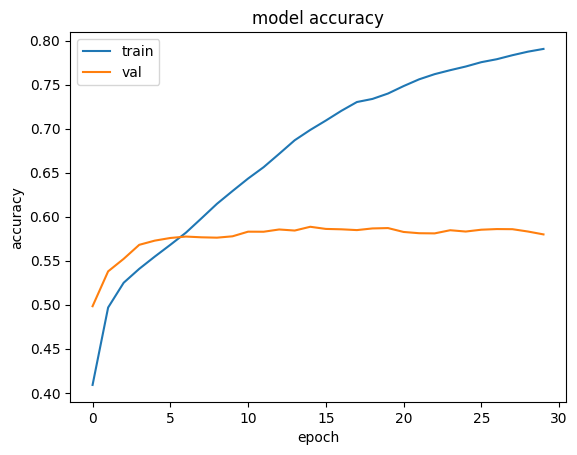

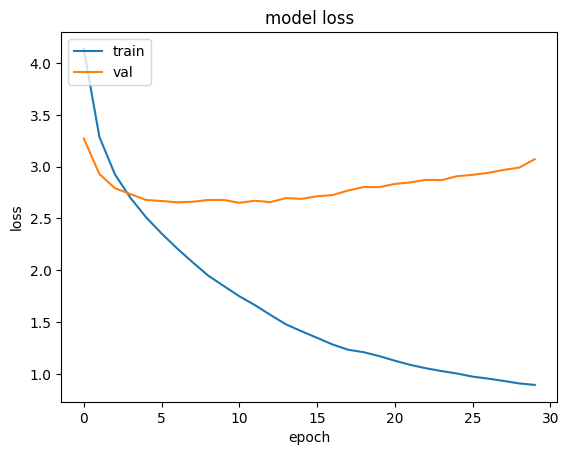

In [ ]:
#Plot accuracy and loss
from matplotlib import pyplot as plt

# Plot accuracy
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

#Plot loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

In [ ]:
#Inference

In [ ]:
from tensorflow.keras.models import load_model
# Load the trained model
best_model = load_model(MODEL_PATH + 'vc_resnet101_30_128_1024_best_weights.h5')
# best_model = tf.keras.saving.load_model(
#     MODEL_PATH+'vc_effnetB0_75_128_best_weights.h5', custom_objects=None, compile=True, safe_mode=True)

In [ ]:
test_df.head(5)

,Unnamed: 0,original_text,video_id,eng_captions,nepali_captions
0,102,-8y1Q0rA3n8_95_102 a man with a sword runs and...,-8y1Q0rA3n8_95_102,a man with a sword runs ands stabs a cardboard...,तरवार बोकेको मानिस दौडन्छ र कार्डबोर्डको निशान...
1,103,-8y1Q0rA3n8_95_102 a man with a sword stabs a ...,-8y1Q0rA3n8_95_102,a man with a sword stabs a target,तरवार भएको मानिसले निशाना प्रहार गर्छ
2,104,-8y1Q0rA3n8_95_102 a man with a sword stabs a ...,-8y1Q0rA3n8_95_102,a man with a sword stabs a target,तरवार भएको मानिसले निशाना प्रहार गर्छ
3,105,-8y1Q0rA3n8_95_102 a man is stabbing a cardboa...,-8y1Q0rA3n8_95_102,a man is stabbing a cardboard cutout with a sword,एक जना मानिसले तरवारले कार्डबोर्ड कटआउटलाई छुर...
4,106,-8y1Q0rA3n8_95_102 a man stuck a sword through...,-8y1Q0rA3n8_95_102,a man stuck a sword through a piece of paper,एउटा मानिसले कागजको टुक्रामा तरवार हान्यो


In [ ]:
def generate_captions(model, feature, tokenizer, max_caption_length):
    if 'bos' not in tokenizer.word_index:
        raise KeyError("'bos' token is missing from the tokenizer.word_index dictionary.")
    if 'eos' not in tokenizer.word_index:
        raise KeyError("'eos' token is missing from the tokenizer.word_index dictionary.")

    # Initialize the decoder input with <bos> token
    decoder_input = np.zeros((1, 10, num_decoder_tokens))
    decoder_input[0, 0, tokenizer.word_index['bos']] = 1

    # Initialize the generated caption
    generated_caption = ''

    # Iterate until maximum caption length is reached or <eos> token is generated
    for i in range(1,max_caption_length-1):
        # Predict the next word in the caption
        predictions = model.predict([np.array([feature]), decoder_input])
        predicted_word_index = np.argmax(predictions[0, i-1, :])

        # Handle unknown word index
        if predicted_word_index not in tokenizer.index_word:
            predicted_word = '<unknown>'
        else:
            # Convert the predicted word index to the corresponding word
            predicted_word = tokenizer.index_word[predicted_word_index]

        # Break loop if <eos> token is generated
        if predicted_word == 'eos':
            break

        # Concatenate the predicted word to the generated caption
        generated_caption += predicted_word + ' '

        # Update the decoder input for the next iteration
        #decoder_input = np.zeros((1, 1, num_decoder_tokens))
        decoder_input[0, i, predicted_word_index] = i

    # Handle empty caption
    if generated_caption.strip() == '':
        generated_caption = '<empty>'

    return generated_caption.strip()


In [ ]:
v_id = test_df['video_id'].iloc[300].strip()
print(v_id)
feature = extract_features(v_id+'.avi',model_cnn_load())
cap = generate_captions(model,feature,tokenizer,10)
print(cap)

0hyZ__3YhZc_562_568
102967424/102967424 [==============================] - 1s 0us/step
0hyZ__3YhZc_562_568
Processing video 0hyZ__3YhZc_562_568.avi
0hyZ__3YhZc_562_568.avi


In [ ]:
import nltk
#import keras_nlp
from nltk.translate.bleu_score import sentence_bleu
from nltk.translate.meteor_score import meteor_score
#from nltk.translate.cider_score import Cider
nltk.download('wordnet')
#keras_nlp.metrics.RougeL(use_stemmer=False, dtype=None, name="rouge-l")

# Function to evaluate the generated captions using BLEU, METEOR, and ROGUE metrics
def evaluate_metric(references, hypothesis):
    bleu1 = sentence_bleu(references,hypothesis,weights=(1, 0, 0, 0))
    bleu2 = sentence_bleu(references,hypothesis,weights=(0.5, 0.5, 0, 0))
    bleu3 = sentence_bleu(references,hypothesis,weights=(0.33, 0.33, 0.33, 0))
    bleu4 = sentence_bleu(references,hypothesis,weights=(0.25, 0.25, 0.25, 0.25))
    meteor = meteor_score(references,hypothesis)

    return bleu1, bleu2, bleu3, bleu4, meteor

def evaluate_captions(feat_dict, data_list,model, tokenizer, max_caption_length):
  bleu1_scores = []
  bleu2_scores = []
  bleu3_scores = []
  bleu4_scores = []
  meteor_scores = []

  # Convert list of lists to DataFrame
  data = pd.DataFrame(data_list, columns=["caption", "video_id"])
  data["caption"] = data["caption"].str.replace("bos ","")
  data["caption"] = data["caption"].str.replace(" eos","")

  for key, value in feat_dict.items():
    print(key)
    v_id = key.strip()+'.avi'
    feature = value
    captions = data.loc[data['video_id'] == key, 'caption'].tolist()
    references = [sentence.split() for sentence in captions]
    predicted_caption = generate_captions(model, feature, tokenizer, max_caption_length).split()
    bleu1, bleu2, bleu3, bleu4, meteor = evaluate_metric(references,predicted_caption)
    bleu1_scores.append(bleu1)
    bleu2_scores.append(bleu2)
    bleu3_scores.append(bleu3)
    bleu4_scores.append(bleu4)
    meteor_scores.append(meteor)

  # Calculate average scores
  avg_bleu1_score = np.mean(bleu1_scores)
  avg_bleu2_score = np.mean(bleu2_scores)
  avg_bleu3_score = np.mean(bleu3_scores)
  avg_bleu4_score = np.mean(bleu4_scores)
  avg_meteor_score = np.mean(meteor_scores)

  return avg_bleu1_score, avg_bleu2_score, avg_bleu3_score, avg_bleu4_score, avg_meteor_score



[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [ ]:
TEST_FEATURE_DIR = test_drive_path
test_ids = test_video_ids
print(len(test_ids))
test_feat = {}
for f_name in os.listdir(TEST_FEATURE_DIR):
    t_f = np.load(os.path.join(TEST_FEATURE_DIR, f_name))
    test_feat[f_name[:-4]] = t_f

197


In [ ]:
avg_bleu1_score, avg_bleu2_score, avg_bleu3_score, avg_bleu4_score, avg_meteor_score =evaluate_captions(test_feat,test_list,best_model,tokenizer,10)
print("BLEU-1: ", str(avg_bleu1_score))
print("BLEU-2: ", str(avg_bleu2_score))
print("BLEU-3: ", str(avg_bleu3_score))
print("BLEU-4: ", str(avg_bleu4_score))
print("METEOR: ", str(avg_meteor_score))


-8y1Q0rA3n8_95_102
1/1 [==============================] - 0s 39ms/step
-_hbPLsZvvo_5_8
1/1 [==============================] - 0s 39ms/step


/usr/local/lib/python3.10/dist-packages/nltk/translate/bleu_score.py:552: UserWarning: 
The hypothesis contains 0 counts of 3-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
/usr/local/lib/python3.10/dist-packages/nltk/translate/bleu_score.py:552: UserWarning: 
The hypothesis contains 0 counts of 4-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)


1/1 [==============================] - 0s 40ms/step
-bjOB4zS0uE_100_105
1/1 [==============================] - 0s 43ms/step


/usr/local/lib/python3.10/dist-packages/nltk/translate/bleu_score.py:552: UserWarning: 
The hypothesis contains 0 counts of 2-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)


1/1 [==============================] - 0s 39ms/step
-rkErLY0rRc_26_35
1/1 [==============================] - 0s 42ms/step
05Gtb7_9tLU_0_9
1/1 [==============================] - 0s 40ms/step
05gNigkqfNU_25_34
1/1 [==============================] - 0s 39ms/step
05gNigkqfNU_78_84
1/1 [==============================] - 0s 38ms/step
0hyZ__3YhZc_562_568
1/1 [==============================] - 0s 39ms/step
0lh_UWF9ZP4_174_178
1/1 [==============================] - 0s 39ms/step
0lh_UWF9ZP4_183_190
1/1 [==============================] - 0s 38ms/step
0lh_UWF9ZP4_79_82
1/1 [==============================] - 0s 39ms/step
1hPxGmTGarM_9_19
1/1 [==============================] - 0s 39ms/step
1mIyMRPV8kg_9_17
1/1 [==============================] - 0s 45ms/step
229NvV0SRHw_0_5
1/1 [==============================] - 0s 50ms/step
2Nn2CAeaI5k_72_77
1/1 [==============================] - 0s 50ms/step
27mxaePkYB4_8_14
1/1 [==============================] - 0s 55ms/step
2R_OAYQIkXM_14_22
1/1 [================

In [ ]:
# resnet50 30 128 valid
print("BLEU-1: ", str(avg_bleu1_score))
print("BLEU-2: ", str(avg_bleu2_score))
print("BLEU-3: ", str(avg_bleu3_score))
print("BLEU-4: ", str(avg_bleu4_score))
print("METEOR: ", str(avg_meteor_score))

BLEU-1:  0.5672619613566111
BLEU-2:  0.34747455014735207
BLEU-3:  0.14389804408588316
BLEU-4:  0.10030373444493196
METEOR:  0.4386314419788963


In [ ]:
# resnet50 30 128 test
print("BLEU-1: ", str(avg_bleu1_score))
print("BLEU-2: ", str(avg_bleu2_score))
print("BLEU-3: ", str(avg_bleu3_score))
print("BLEU-4: ", str(avg_bleu4_score))
print("METEOR: ", str(avg_meteor_score))

BLEU-1:  0.552163403432439
BLEU-2:  0.31346125156646376
BLEU-3:  0.10262058670967872
BLEU-4:  0.073004967940648
METEOR:  0.4221124990075284


In [ ]:
# effnet 30 64 test
print("BLEU-1: ", str(avg_bleu1_score))
print("BLEU-2: ", str(avg_bleu2_score))
print("BLEU-3: ", str(avg_bleu3_score))
print("BLEU-4: ", str(avg_bleu4_score))
print("METEOR: ", str(avg_meteor_score))

BLEU-1:  0.6232882697430463
BLEU-2:  0.3973987839979453
BLEU-3:  0.20818888889636203
BLEU-4:  0.1351737076670716
METEOR:  0.4562288613746936


In [ ]:
# effnet 30 64 valid
print("BLEU-1: ", str(avg_bleu1_score))
print("BLEU-2: ", str(avg_bleu2_score))
print("BLEU-3: ", str(avg_bleu3_score))
print("BLEU-4: ", str(avg_bleu4_score))
print("METEOR: ", str(avg_meteor_score))

In [ ]:
# effnet 15 64 valid
print("BLEU-1: ", str(avg_bleu1_score))
print("BLEU-2: ", str(avg_bleu2_score))
print("BLEU-3: ", str(avg_bleu3_score))
print("BLEU-4: ", str(avg_bleu4_score))
print("METEOR: ", str(avg_meteor_score))

BLEU-1:  0.6253969415863776
BLEU-2:  0.39802169797482323
BLEU-3:  0.18834195618527352
BLEU-4:  0.12344340365304311
METEOR:  0.46130127621941136


In [ ]:
# effnet 15 64 test
print("BLEU-1: ", str(avg_bleu1_score))
print("BLEU-2: ", str(avg_bleu2_score))
print("BLEU-3: ", str(avg_bleu3_score))
print("BLEU-4: ", str(avg_bleu4_score))
print("METEOR: ", str(avg_meteor_score))

BLEU-1:  0.6161771815325114
BLEU-2:  0.3766808976628804
BLEU-3:  0.15183727193199623
BLEU-4:  0.09782693077283092
METEOR:  0.439872245762076


In [ ]:
# effnet 60 128 test
print("BLEU-1: ", str(avg_bleu1_score))
print("BLEU-2: ", str(avg_bleu2_score))
print("BLEU-3: ", str(avg_bleu3_score))
print("BLEU-4: ", str(avg_bleu4_score))
print("METEOR: ", str(avg_meteor_score))

BLEU-1:  0.6009729272419627
BLEU-2:  0.38442797318792876
BLEU-3:  0.20476340357988568
BLEU-4:  0.11753144274482936
METEOR:  0.43752568229530514


In [ ]:
# effnet 60 128 valid
print("BLEU-1: ", str(avg_bleu1_score))
print("BLEU-2: ", str(avg_bleu2_score))
print("BLEU-3: ", str(avg_bleu3_score))
print("BLEU-4: ", str(avg_bleu4_score))
print("METEOR: ", str(avg_meteor_score))

BLEU-1:  0.6108909151029606
BLEU-2:  0.3756385683675299
BLEU-3:  0.18692187008935604
BLEU-4:  0.1277340886963575
METEOR:  0.4459695441705169


In [ ]:

##################################################################################################